In [1]:
import velvet as vt

# general packages
import numpy as np
import pandas as pd
import torch
from scipy.sparse import issparse

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann

# plotting packages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm, trange
from IPython.display import clear_output

# color palette object
from colors import colorpalette as colpal

2023-06-16 21:14:24.249269: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-16 21:14:40.054699: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /camp/apps/eb/software/CUDAcore/11.1.1/nvvm/lib64:/camp/apps/eb/software/CUDAcore/11.1.1/extras/CUPTI/lib64:/camp/apps/eb/software/CUDAcore/11.1.1/lib:/camp/apps/eb/software/binutils/2.35-GCCcore-10.2.0/lib:/camp/apps/eb/software/zlib/1.2.11-GCCcore-10.2.0/lib:/camp/apps/eb/software/GCCcore/10.2.0/lib64:/camp/apps/eb/software/GCCcore/10.2.0/lib
2023-06-16 21:14:40.055075: W tensorflow/compi

In [2]:
est = sc.read_h5ad('../data/adata_unprocessed_estimate.h5ad')

In [3]:
from scvelo.core import LinearRegression as scveloLR

def find_gamma(
    total: np.ndarray,
    new: np.ndarray,
    t: float = 2.0,
    model: str = "full",
    gamma_min: float = 0.01,
    gamma_max: float = 10,
) -> np.ndarray:
    """
    Finds gamma, a parameter for the biophysical model of metabolic labelling.

    Parameters
    ----------
    total : np.ndarray
        The total count data.
    new : np.ndarray
        The new count data.
    t : float, optional
        Time variable for the full model, default is 2.0.
    model : str, optional
        The model to be used, default is 'full'. If 'simple', gamma = K. If 'full', gamma is calculated with time variable t.
    gamma_min : float, optional
        The minimum limit for gamma, default is 0.01.
    gamma_max : float, optional
        The maximum limit for gamma, default is 10.

    Returns
    -------
    gamma : np.ndarray
        The calculated gamma value(s).
    """
    # Linear Regression model with percentile clip at 5 and 95
    lr = scveloLR(fit_intercept=False, percentile=[5, 95])
    lr.fit(total, new)
    K = lr.coef_

    if model == "simple":
        gamma = K
    elif model == "full":
        gamma = -np.log(1 - K) / t
        gamma = np.clip(gamma, gamma_min, gamma_max)
    return gamma

In [4]:
adata0 = vt.pp.read("../data/celltyped_adata.h5ad")
adata0 = adata0[adata0.obs.cell_annotation!='other']

In [5]:
neural_types = ['Early_Neural','Neural','pMN','p3','FP','MN','V3']

neural = adata0[[ct in neural_types for ct in adata0.obs.cell_annotation]]

# here we select only genes that are highly variable across replicates
# we exclude r4 as that is additional data that doesn't cover whole timecourse
neural_genes = vt.pp.select_genes(
    neural[neural.obs.rep!='r4'], 
    n_variable_genes=3000, 
    stratify_obs='rep')

In [6]:
neural = vt.pp.size_normalize(
    neural, 
    genes=neural_genes, 
    total_layer='total', 
    new_layer='new',
    unsparsify=True
)

In [7]:
cnt_gamma = find_gamma(neural.layers['total'], neural.layers['new'])

In [8]:
# sns.kdeplot(np.log(2)/cnt_gamma, cut=0)
# plt.xlim((0,20))

In [9]:
# v = ng / (1-e^-tg) - gx

n = neural.layers['new']
x = neural.layers['total']
g = cnt_gamma
t = 2.0
cnt_vel = (n*g)/(1-np.exp(-t*g)) - g*x
neural.layers['velocity_count'] = cnt_vel

In [10]:
est_neural = est[neural.obs_names]
est_neural = vt.pp.size_normalize(
    est_neural, 
    genes=neural_genes, 
    total_layer='total', 
    new_layer='new_estimated',
    unsparsify=True
)

est_gamma = find_gamma(est_neural.layers['total'], est_neural.layers['new_estimated'])

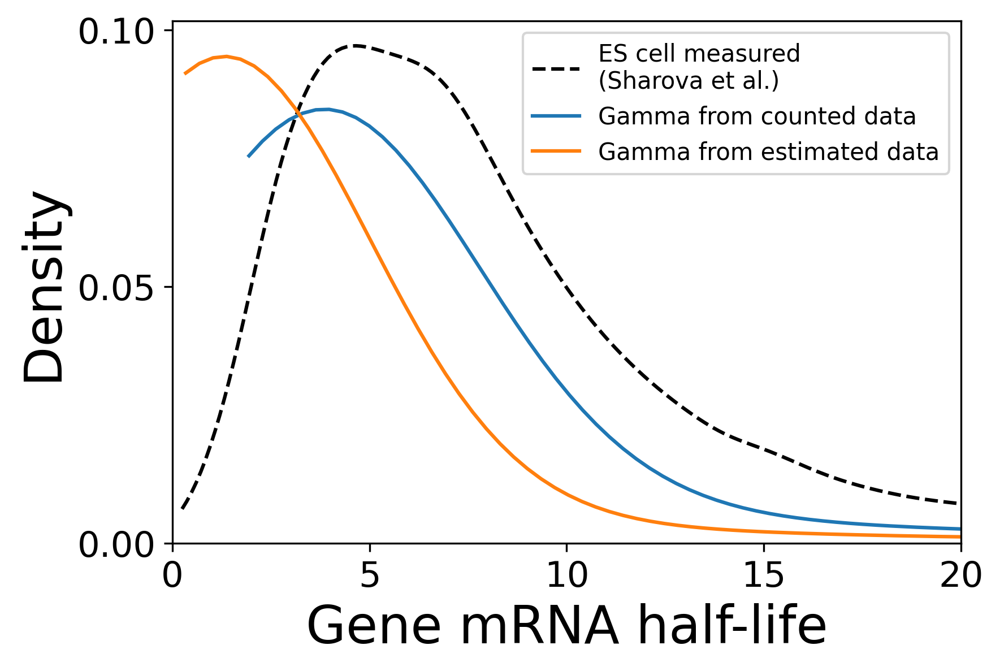

In [11]:
hl = pd.read_csv('../input_data/sharova_et_al_half_lives.csv')['Halflife for all cells'].values
plt.figure(figsize=(6,4), dpi=300)
hl= hl[hl>0.1]
sns.kdeplot(hl, cut=0, label='ES cell measured \n(Sharova et al.)', color='k', linestyle='--')
sns.kdeplot(np.log(2)/cnt_gamma, cut=0, label='Gamma from counted data')
sns.kdeplot(np.log(2)/est_gamma, cut=0, label='Gamma from estimated data')
plt.legend()
plt.xlim((0,20))
plt.xlabel("Gene mRNA half-life", fontsize=22)
plt.ylabel("Density", fontsize=22)
plt.xticks([0,5,10,15,20],fontsize=15)
plt.yticks([0,0.05,0.1],fontsize=15)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig("../figures/0.5.0_estimation_gamma.png", bbox_inches='tight')

plt.show()

switching kernel to run dynamo...

In [15]:
import velvet as vt

# general packages
import numpy as np
import pandas as pd
import torch
from scipy.sparse import issparse

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann

# plotting packages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm, trange
from IPython.display import clear_output

# color palette object
from colors import colorpalette as colpal

import dynamo as dyn

|-----> setting visualization default mode in dynamo. Your customized matplotlib settings might be overritten.


In [16]:
est = sc.read_h5ad('../data/adata_unprocessed_estimate.h5ad')

adata0 = vt.pp.read("../data/celltyped_adata.h5ad")
adata0 = adata0[adata0.obs.cell_annotation!='other']

neural_types = ['Early_Neural','Neural','pMN','p3','FP','MN','V3']

neural = adata0[[ct in neural_types for ct in adata0.obs.cell_annotation]]

# here we select only genes that are highly variable across replicates
# we exclude r4 as that is additional data that doesn't cover whole timecourse
neural_genes = vt.pp.select_genes(
    neural[neural.obs.rep!='r4'], 
    n_variable_genes=3000, 
    stratify_obs='rep')

est_neural = est[neural.obs_names]


In [5]:
est_neural.obs['labelling_time'] = 2.0
est_neural.layers['new'] = est_neural.layers['new_estimated'].copy()
dyn.pp.recipe_monocle(
    est_neural, 
    genes_to_use=neural_genes, 
    keep_filtered_genes=False,
    keep_filtered_cells=True,
    tkey='labelling_time'
)

dyn.tl.dynamics(est_neural)

|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----> 
Dynamo detects your labeling data is from a one-shot experiment. If experiment type is not corrent, please correct 
this via supplying the correct experiment_type (one of `one-shot`, `kin`, `deg`) as needed.
|-----> detected experiment type: one-shot
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|---

estimating gamma: 100%|██████████| 2000/2000 [13:00<00:00,  2.56it/s]


AnnData object with n_obs × n_vars = 26533 × 2000
    obs: 'X_TC_alpha', 'total_TC_alpha', 'unspliced_TC_alpha', 'spliced_TC_alpha', 'p_e', 'p_c_TC', 'sample', 'timepoint', 'rep', 'labelling_time', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'new_Size_Factor', 'initial_new_cell_size', 'total_Size_Factor', 'initial_total_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'frac', 'ntr', 'alpha', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'beta_k', 'gamma_k', 'use_for_dynamics'
    uns: 'pp', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'dynamics'
    obsm: 'X_pca', 'X'
    varm: 'alpha'
    layers: 'new_estimated', 'old_estimated', 'total', 'new', 'X_new', 'X_total', 'M_t', 'M_tt', 'M_n', 'M_tn', 'M_nn', 'velocity_N', 'velocity_T'
    obsp: 'moment

In [6]:
X = est_neural.layers['X_total'].A
V = est_neural.layers['velocity_T'].A

V = np.nan_to_num(V)
Y = np.clip(X + V, 0, 1000)

Xlog = np.log1p(X)
Xlogscale = Xlog - Xlog.mean(0)
pca = PCA()
Xpca = pca.fit_transform(Xlogscale)
est_neural.obsm['X_dynamo'] = Xpca

Ylogscale = np.log1p(Y) - Xlog.mean(0)
Ypca = pca.transform(Ylogscale)

est_neural.obsm['velocity_dynamo'] = Ypca - Xpca
est_neural.uns["velocity_params"] = {'embeddings':'dynamo'}


In [9]:
est_neural.obs['cell_annotation'] = neural.obs.cell_annotation

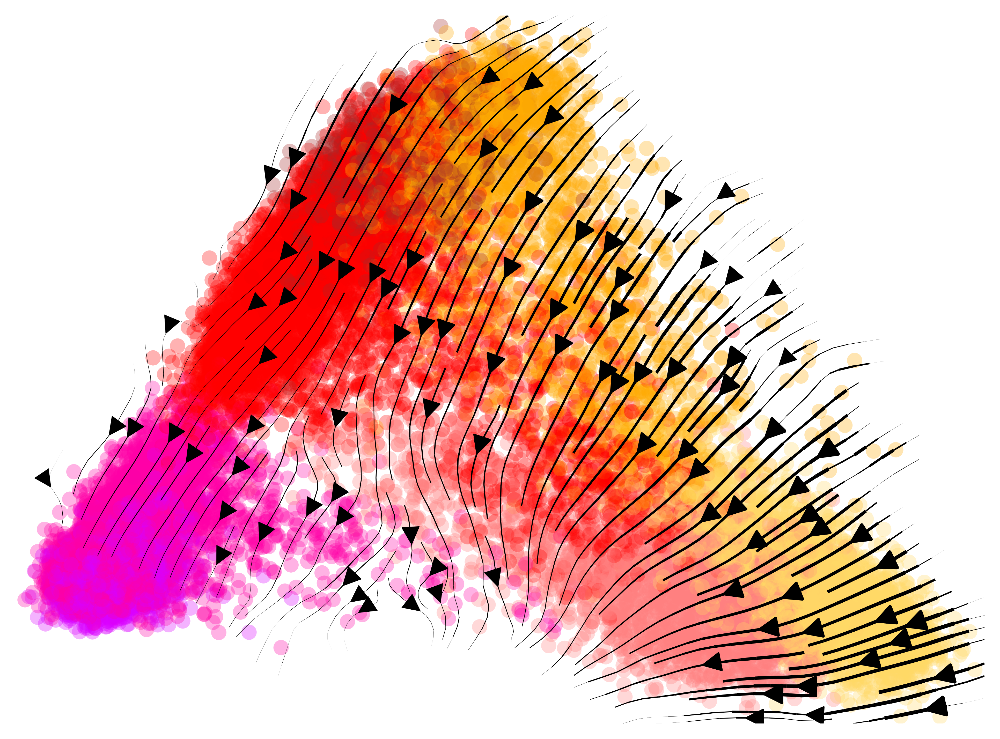

In [11]:
fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    est_neural, 
    basis='dynamo', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_loc=False,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/0.5.1_estimated_dynamo_prediction.png', transparent=True)
plt.show()

# Velvet

In [12]:
est = sc.read_h5ad('../data/adata_unprocessed_estimate.h5ad')

adata0 = vt.pp.read("../data/celltyped_adata.h5ad")
adata0 = adata0[adata0.obs.cell_annotation!='other']

neural_types = ['Early_Neural','Neural','pMN','p3','FP','MN','V3']

neural = adata0[[ct in neural_types for ct in adata0.obs.cell_annotation]]

# here we select only genes that are highly variable across replicates
# we exclude r4 as that is additional data that doesn't cover whole timecourse
neural_genes = vt.pp.select_genes(
    neural[neural.obs.rep!='r4'], 
    n_variable_genes=3000, 
    stratify_obs='rep')

est_neural = est[neural.obs_names]
est_neural.obs['cell_annotation'] = neural.obs.cell_annotation
est_neural.layers['new'] = est_neural.layers['new_estimated'].copy()

neural = est_neural.copy()


In [13]:
neural = vt.pp.size_normalize(
    neural, 
    genes=neural_genes, 
    total_layer='total', 
    new_layer='new',
    unsparsify=True
)

vt.pp.neighborhood(neural)

Using ScanPy methods to calculate distances, indices, connectivities, transitions, ... done! 
KNN indices for Velvet stored in .obsm['knn_index'].
Dense similarity transition matrix for Velvet stored in .obsm['Ts'].


In [14]:
# 4. set up model
# we setup the data with scvi registration, 
# initialise the model
# and set up the model priors for rho and gamma

neural = neural.copy()

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(neural, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    neural,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()

INFO     Generating sequential column names                                                                        


In [15]:
model.train(
    batch_size = neural.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 200,
    constrain_vf_after_epochs = 200,
    lr=0.001,
)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1000/1000: 100%|██████████| 1000/1000 [08:44<00:00,  1.89it/s, loss=3.99, v_num=1]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [08:44<00:00,  1.91it/s, loss=3.99, v_num=1]


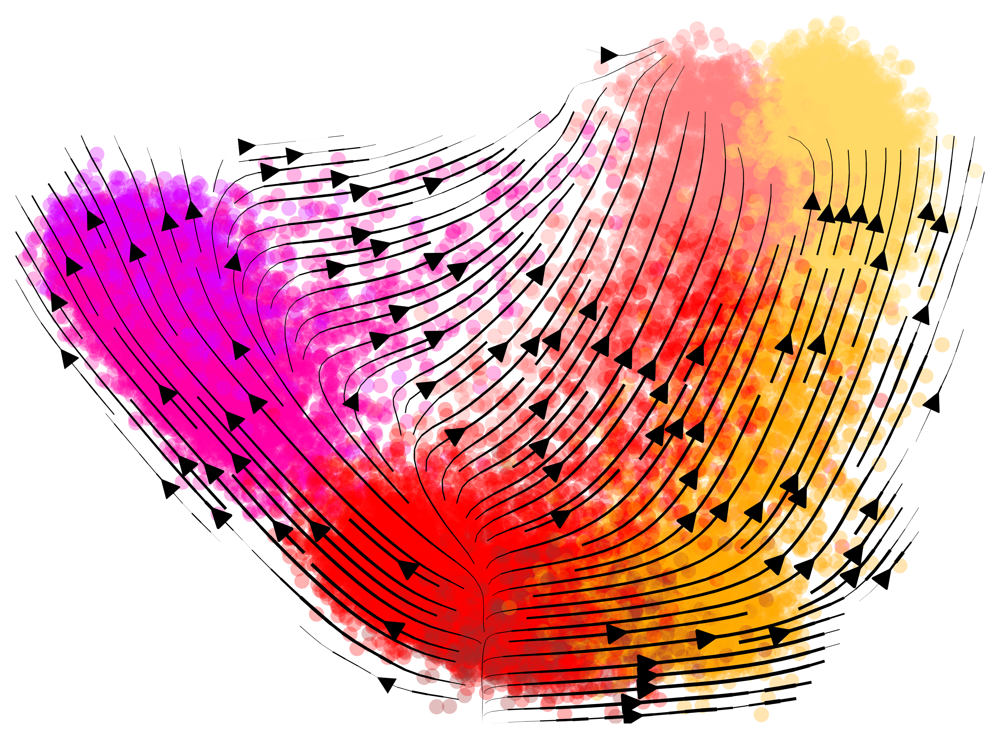

In [18]:
X = model.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

x = torch.tensor(X, device=torch_device)
b = torch.zeros(X.shape[0], device=torch_device)

z = model.module.inference(x, b)['z']
v = model.module.vf(z)

pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
zfs = (z+v).detach().cpu().numpy()
z_pca = pca.fit_transform(zs)
zf_pca = pca.transform(zfs)
v_pca = zf_pca - z_pca

copy = model.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.obsm['velocity_vae'] = v_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

fig = plt.figure(figsize=(8,6), dpi=300)

ax = fig.subplots()

scv.pl.velocity_embedding_stream(
    copy, 
    basis='vae', 
    title="",
    color='cell_annotation', 
    show=False,
    ax=ax,
    palette=colpal.celltype,
    arrow_size=2,
    legend_loc=False,
    legend_fontoutline=10,
    size=200,
    fontsize=16, 
    legend_fontsize=16, components='1,2'
)
plt.savefig('../figures/0.5.4_velvet_estimation.png')
plt.show()